<a href="https://colab.research.google.com/github/authorsunilsir/Data-Science-Projects/blob/main/Deep_CSAT_ANN_Predictive_Model(finalised).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#DEEP CSAT ANN Predictive Model in the context of E-commerce Buisness


## Data loading

### Subtask:
Load the data from the provided CSV file into a pandas DataFrame.


**Reasoning**:
Load the data from the provided CSV file into a pandas DataFrame and display its first few rows and shape.



In [103]:
import pandas as pd

df = pd.read_csv('/content/eCommerce_Customer_support_data.csv')
display(df.head())
print(df.shape)


,Unique id,channel_name,category,Sub-category,Customer Remarks,Order_id,order_date_time,Issue_reported at,issue_responded,Survey_response_Date,Customer_City,Product_category,Item_price,connected_handling_time,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score
0,7e9ae164-6a8b-4521-a2d4-58f7c9fff13f,Outcall,Product Queries,Life Insurance,NaN,c27c9bb4-fa36-4140-9f1f-21009254ffdb,NaN,01/08/2023 11:13,01/08/2023 11:47,01-Aug-23,NaN,NaN,NaN,NaN,Richard Buchanan,Mason Gupta,Jennifer Nguyen,On Job Training,Morning,5
1,b07ec1b0-f376-43b6-86df-ec03da3b2e16,Outcall,Product Queries,Product Specific Information,NaN,d406b0c7-ce17-4654-b9de-f08d421254bd,NaN,01/08/2023 12:52,01/08/2023 12:54,01-Aug-23,NaN,NaN,NaN,NaN,Vicki Collins,Dylan Kim,Michael Lee,>90,Morning,5
2,200814dd-27c7-4149-ba2b-bd3af3092880,Inbound,Order Related,Installation/demo,NaN,c273368d-b961-44cb-beaf-62d6fd6c00d5,NaN,01/08/2023 20:16,01/08/2023 20:38,01-Aug-23,NaN,NaN,NaN,NaN,Duane Norman,Jackson Park,William Kim,On Job Training,Evening,5
3,eb0d3e53-c1ca-42d3-8486-e42c8d622135,Inbound,Returns,Reverse Pickup Enquiry,NaN,5aed0059-55a4-4ec6-bb54-97942092020a,NaN,01/08/2023 20:56,01/08/2023 21:16,01-Aug-23,NaN,NaN,NaN,NaN,Patrick Flores,Olivia Wang,John Smith,>90,Evening,5
4,ba903143-1e54-406c-b969-46c52f92e5df,Inbound,Cancellation,Not Needed,NaN,e8bed5a9-6933-4aff-9dc6-ccefd7dcde59,NaN,01/08/2023 10:30,01/08/2023 10:32,01-Aug-23,NaN,NaN,NaN,NaN,Christopher Sanchez,Austin Johnson,Michael Lee,0-30,Morning,5


(85907, 20)


## Data exploration

### Subtask:
Explore the dataset to understand its characteristics.


**Reasoning**:
Explore the dataset by examining data types, missing values, distributions, correlations, and potential outliers.



Unique id                   object
channel_name                object
category                    object
Sub-category                object
Customer Remarks            object
Order_id                    object
order_date_time             object
Issue_reported at           object
issue_responded             object
Survey_response_Date        object
Customer_City               object
Product_category            object
Item_price                 float64
connected_handling_time    float64
Agent_name                  object
Supervisor                  object
Manager                     object
Tenure Bucket               object
Agent Shift                 object
CSAT Score                   int64
dtype: object

Missing value percentages:
 Unique id                   0.000000
channel_name                0.000000
category                    0.000000
Sub-category                0.000000
Customer Remarks           66.542889
Order_id                   21.222950
order_date_time            79.96205

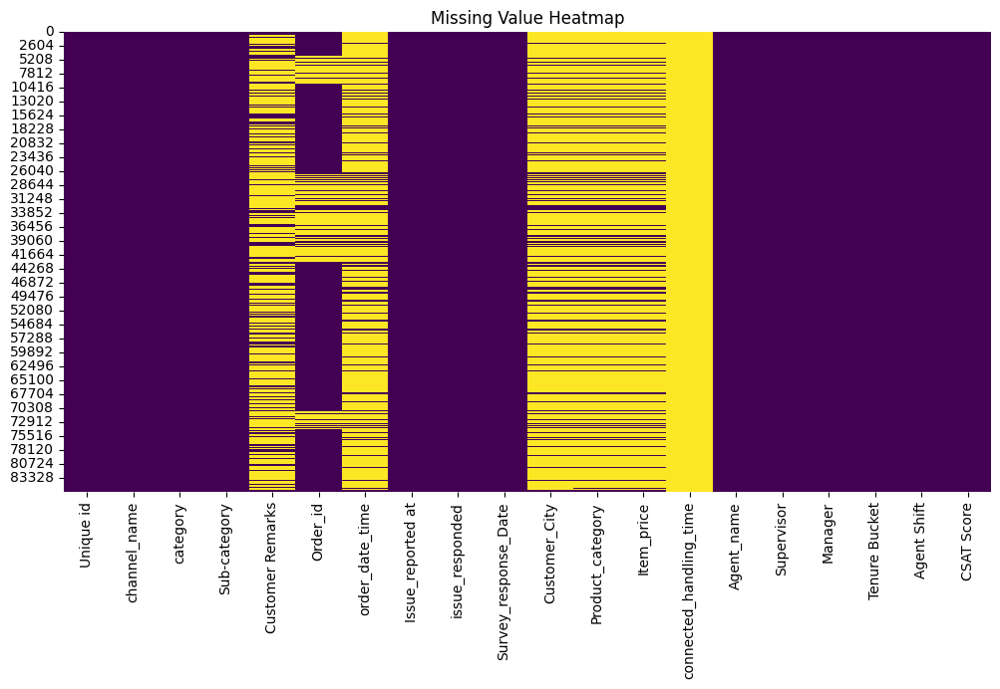


CSAT Score descriptive statistics:
 count    85907.000000
mean         4.242157
std          1.378903
min          1.000000
25%          4.000000
50%          5.000000
75%          5.000000
max          5.000000
Name: CSAT Score, dtype: float64


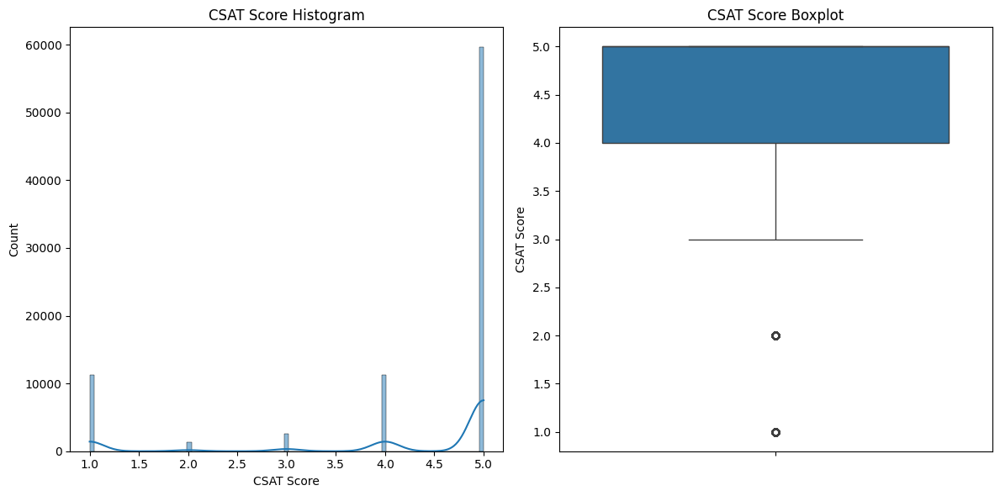


Correlation matrix:
 Item_price                -0.123320
connected_handling_time    0.047526
CSAT Score                 1.000000
Name: CSAT Score, dtype: float64

Shape of data: (85907, 20)


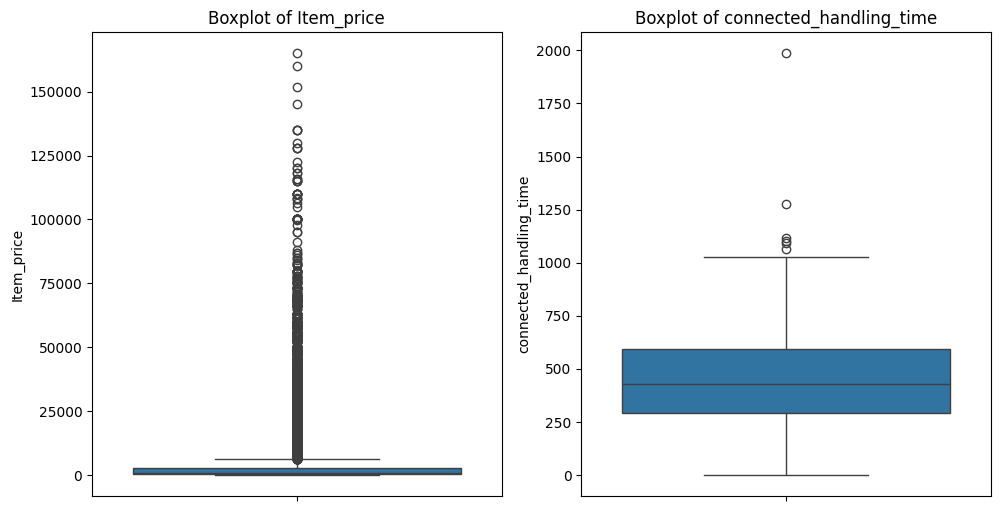

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Examine data types
print(df.dtypes)

# 2. Check for missing values
missing_percentages = df.isnull().sum() * 100 / len(df)
print("\nMissing value percentages:\n", missing_percentages)

# Visualize missing values using a heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Value Heatmap')
plt.show()

# 3. Analyze 'CSAT Score' distribution
print("\nCSAT Score descriptive statistics:\n", df['CSAT Score'].describe())

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(df['CSAT Score'], kde=True)
plt.title('CSAT Score Histogram')

plt.subplot(1, 2, 2)
sns.boxplot(y=df['CSAT Score'])
plt.title('CSAT Score Boxplot')
plt.tight_layout()
plt.show()

# 4. Explore relationships between features and 'CSAT Score'
numerical_features = df.select_dtypes(include=['number']).columns
correlation_matrix = df[numerical_features].corr()
print("\nCorrelation matrix:\n", correlation_matrix['CSAT Score'])


# 5. Determine the shape of the data
print(f"\nShape of data: {df.shape}")

# 6. Identify potential outliers in numerical features (excluding 'CSAT Score')
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_features[numerical_features != 'CSAT Score']):
    plt.subplot(2, 3, i + 1)
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

## Data cleaning

### Subtask:
Clean the data by handling missing values, outliers, and converting categorical features.


**Reasoning**:
Impute missing values, handle outliers, encode categorical features, and convert data types as per the instructions.



In [137]:
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder

# 1. Missing Value Imputation
# Impute numerical features using KNN imputation
numerical_cols = ['Item_price', 'connected_handling_time']
imputer = KNNImputer(n_neighbors=5)
df[numerical_cols] = imputer.fit_transform(df[numerical_cols])

# Impute categorical features with mode
categorical_cols = ['Customer_City', 'Product_category', 'Customer Remarks', 'Order_id']
for col in categorical_cols:
    df[col] = df[col].fillna(df[col].mode()[0])

# 2. Outlier Handling
# Cap outliers using winsorizing for numerical features
for col in numerical_cols:
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    df[col] = np.clip(df[col], lower_bound, upper_bound)

# 3. Categorical Feature Encoding
# Use Label Encoding for categorical features
categorical_cols_to_encode = ['channel_name', 'category', 'Sub-category', 'Agent_name', 'Supervisor', 'Manager', 'Tenure Bucket', 'Agent Shift', 'Customer_City', 'Product_category']
for col in categorical_cols_to_encode:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])

# 4. Data Type Conversion
date_cols = ['order_date_time', 'Issue_reported at', 'Survey_response_Date', 'issue_responded']
for col in date_cols:
    try:
        df[col] = pd.to_datetime(df[col], errors='coerce')
    except Exception as e:
        print(f"Error converting {col}: {e}")

display(df.head(2))

<ipython-input-137-5a1ed3165843>:38: UserWarning: Parsing dates in %d/%m/%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df[col] = pd.to_datetime(df[col], errors='coerce')


,Unique id,channel_name,category,Sub-category,Customer Remarks,Order_id,order_date_time,Issue_reported at,issue_responded,Survey_response_Date,Customer_City,Product_category,Item_price,connected_handling_time,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score
0,7e9ae164-6a8b-4521-a2d4-58f7c9fff13f,2,8,19,Good,c27c9bb4-fa36-4140-9f1f-21009254ffdb,NaT,2023-01-08 11:13:00,2023-01-08 11:47:00,2023-08-01,684,2,5660.774846,462.400826,1072,26,1,4,2,5
1,b07ec1b0-f376-43b6-86df-ec03da3b2e16,2,8,34,Good,d406b0c7-ce17-4654-b9de-f08d421254bd,NaT,2023-01-08 12:52:00,2023-01-08 12:54:00,2023-08-01,684,2,5660.774846,462.400826,1323,9,3,3,2,5


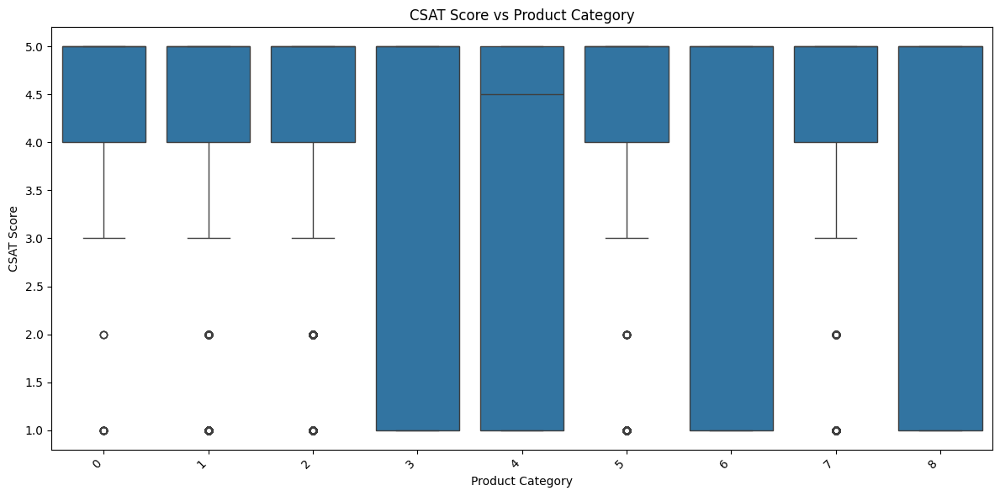

In [37]:
# prompt: Graph of CSAT vs  Porducts

# Assuming 'Product_category' is the product identifier and 'CSAT Score' is the CSAT rating.
plt.figure(figsize=(12, 6))
sns.boxplot(x='Product_category', y='CSAT Score', data=df)
plt.title('CSAT Score vs Product Category')
plt.xlabel('Product Category')
plt.ylabel('CSAT Score')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


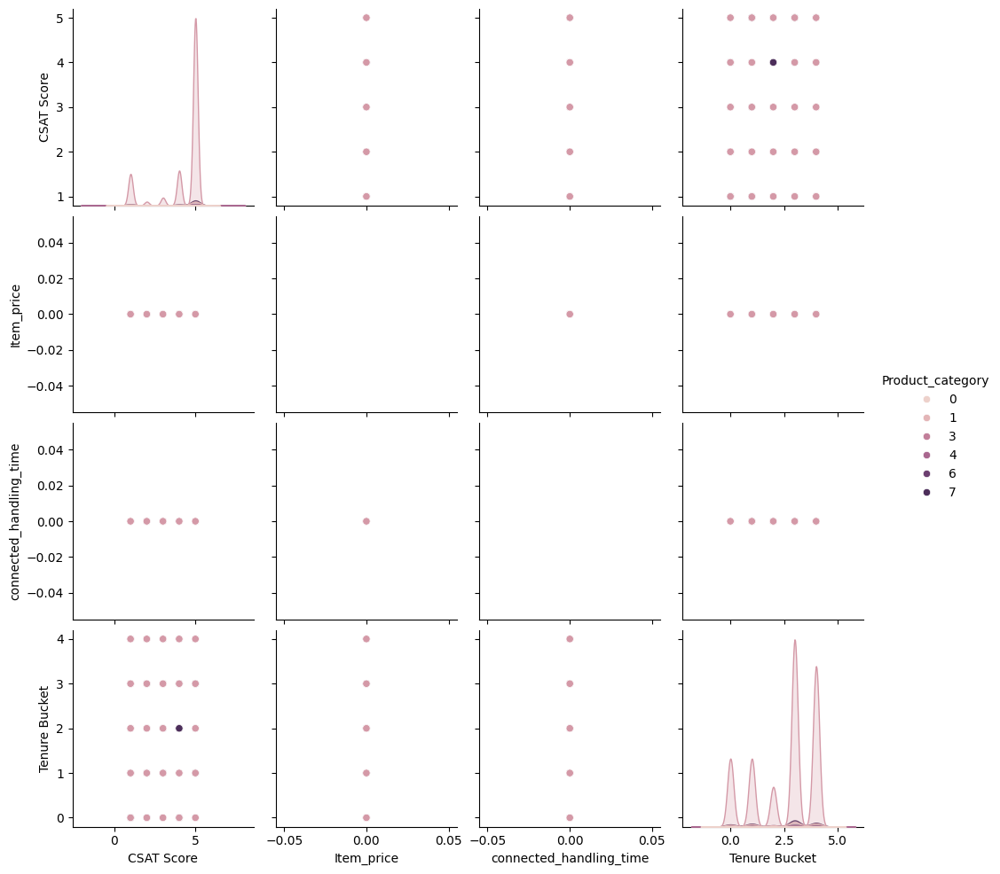

ValueError: could not convert string to float: '7e9ae164-6a8b-4521-a2d4-58f7c9fff13f'

<Figure size 1000x800 with 0 Axes>

In [44]:
# prompt: suggest visualisation

# Pairplot to visualize relationships between numerical features and CSAT Score
sns.pairplot(df, vars=['CSAT Score', 'Item_price', 'connected_handling_time', 'Tenure Bucket'], hue='Product_category')
plt.show()

# Correlation Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()


# Boxplots of CSAT score grouped by different categorical features
for col in ['channel_name', 'category', 'Agent_name', 'Customer_City']:
  plt.figure(figsize=(10, 6))
  sns.boxplot(x=col, y='CSAT Score', data=df)
  plt.title(f'CSAT Score by {col}')
  plt.xticks(rotation=45, ha='right')
  plt.show()

# Distribution of CSAT scores over time (if you have a relevant date column)
# Assuming 'Survey_response_Date' is the relevant column
if 'Survey_response_Date' in df.columns:
    df['Survey_response_Date'] = pd.to_datetime(df['Survey_response_Date'])
    df['Month'] = df['Survey_response_Date'].dt.to_period('M')
    plt.figure(figsize=(12, 6))
    sns.lineplot(x='Month', y='CSAT Score', data=df.groupby('Month')['CSAT Score'].mean().reset_index())
    plt.title('Average CSAT Score over Time')
    plt.xlabel('Month')
    plt.ylabel('Average CSAT Score')
    plt.xticks(rotation=45, ha='right')
    plt.show()


## Feature engineering

### Subtask:
Engineer new features from the cleaned data.


**Reasoning**:
Create time-based features, interaction features, and scale numerical features.



In [41]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# 1. Time-based features
df['Issue_reported at'] = pd.to_datetime(df['Issue_reported at'], errors='coerce')
df['issue_responded'] = pd.to_datetime(df['issue_responded'], errors='coerce')
df['Survey_response_Date'] = pd.to_datetime(df['Survey_response_Date'], errors='coerce')
df['order_date_time'] = pd.to_datetime(df['order_date_time'], errors='coerce')

df['time_to_respond'] = (df['issue_responded'] - df['Issue_reported at']).dt.total_seconds() / 3600
df['order_to_survey'] = (df['Survey_response_Date'] - df['order_date_time']).dt.days

# Impute missing time differences with the median.
df['time_to_respond'] = df['time_to_respond'].fillna(df['time_to_respond'].median())
df['order_to_survey'] = df['order_to_survey'].fillna(df['order_to_survey'].median())


# 2. Interaction features
df['product_price_interaction'] = df['Product_category'] * df['Item_price']
df['agent_shift_csat_interaction'] = df['Agent Shift'] * df['CSAT Score']

# 3. Feature scaling
numerical_cols_to_scale = ['Item_price', 'connected_handling_time', 'time_to_respond', 'order_to_survey', 'product_price_interaction', 'agent_shift_csat_interaction']
scaler = StandardScaler()
df[numerical_cols_to_scale] = scaler.fit_transform(df[numerical_cols_to_scale])

display(df.head())

,Unique id,channel_name,category,Sub-category,Customer Remarks,Order_id,order_date_time,Issue_reported at,issue_responded,Survey_response_Date,...,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score,time_to_respond,order_to_survey,product_price_interaction,agent_shift_csat_interaction
0,7e9ae164-6a8b-4521-a2d4-58f7c9fff13f,2,8,19,Good,c27c9bb4-fa36-4140-9f1f-21009254ffdb,NaT,2023-01-08 11:13:00,2023-01-08 11:47:00,2023-08-01,...,1072,26,1,4,2,5,-0.158241,-0.098184,-0.293067,0.779515
1,b07ec1b0-f376-43b6-86df-ec03da3b2e16,2,8,34,Good,d406b0c7-ce17-4654-b9de-f08d421254bd,NaT,2023-01-08 12:52:00,2023-01-08 12:54:00,2023-08-01,...,1323,9,3,3,2,5,-0.161254,-0.098184,-0.293067,0.779515
2,200814dd-27c7-4149-ba2b-bd3af3092880,1,5,15,Good,c273368d-b961-44cb-beaf-62d6fd6c00d5,NaT,2023-01-08 20:16:00,2023-01-08 20:38:00,2023-08-01,...,370,18,5,4,1,5,-0.159371,-0.098184,-0.293067,-0.389535
3,eb0d3e53-c1ca-42d3-8486-e42c8d622135,1,10,40,Good,5aed0059-55a4-4ec6-bb54-97942092020a,NaT,2023-01-08 20:56:00,2023-01-08 21:16:00,2023-08-01,...,1024,33,2,3,1,5,-0.159559,-0.098184,-0.293067,-0.389535
4,ba903143-1e54-406c-b969-46c52f92e5df,1,1,22,Good,e8bed5a9-6933-4aff-9dc6-ccefd7dcde59,NaT,2023-01-08 10:30:00,2023-01-08 10:32:00,2023-08-01,...,247,4,3,0,2,5,-0.161254,-0.098184,-0.293067,0.779515


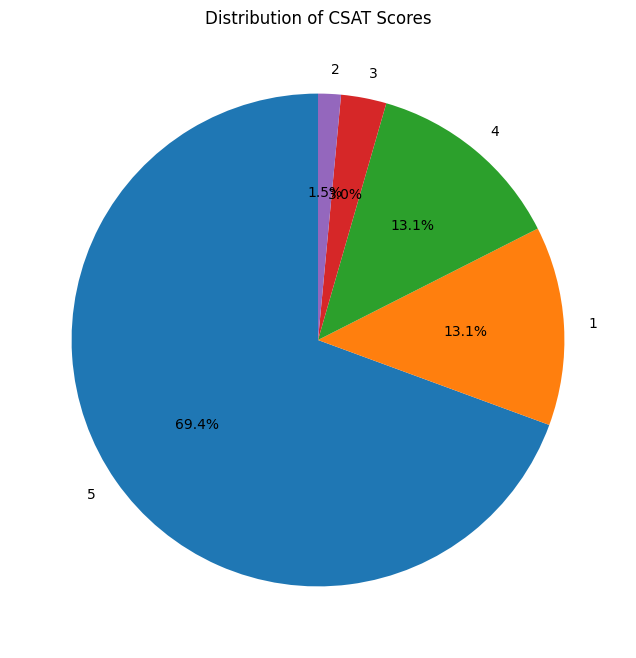

In [106]:
# prompt: Draw a pie chart to display csat score

# Assuming 'CSAT Score' is the column containing the CSAT scores.
plt.figure(figsize=(8, 8))
df['CSAT Score'].value_counts().plot.pie(autopct='%1.1f%%', startangle=90)
plt.title('Distribution of CSAT Scores')
plt.ylabel('')  # Remove the y-axis label
plt.show()


<ipython-input-109-5c01f11cab02>:10: UserWarning: Glyph 38337 (\N{CJK UNIFIED IDEOGRAPH-95C1}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-109-5c01f11cab02>:10: UserWarning: Glyph 32937 (\N{CJK UNIFIED IDEOGRAPH-80A9}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-109-5c01f11cab02>:10: UserWarning: Glyph 20772 (\N{CJK UNIFIED IDEOGRAPH-5124}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-109-5c01f11cab02>:10: UserWarning: Glyph 29999 (\N{CJK UNIFIED IDEOGRAPH-752F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-109-5c01f11cab02>:10: UserWarning: Glyph 65504 (\N{FULLWIDTH CENT SIGN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-109-5c01f11cab02>:10: UserWarning: Glyph 23866 (\N{CJK UNIFIED IDEOGRAPH-5D3A}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-109-5c01f11cab02>:10: UserWarning: Glyph 22942 (\N{CJK UNIFIED IDEOGRAPH-599E}) missing from

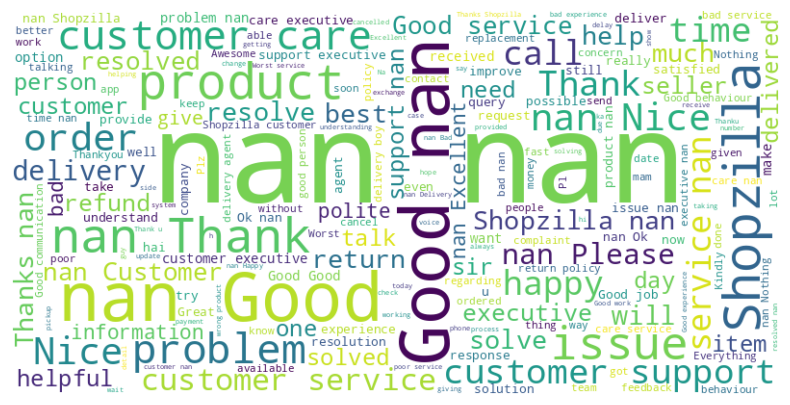

In [109]:
# prompt: Visualize customer remark in a suitable way

# Visualize the distribution of customer remarks
plt.figure(figsize=(10, 6))
df['Customer Remarks'].value_counts().plot(kind='bar')
plt.title('Distribution of Customer Remarks')
plt.xlabel('Customer Remark')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Wordcloud for customer remarks (requires wordcloud library)
from wordcloud import WordCloud
# Combine all customer remarks into a single string
text = " ".join(remark for remark in df['Customer Remarks'].astype(str))

# Create a WordCloud object
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Display the generated image:
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


## Data splitting

### Subtask:
Split the data into training, validation, and testing sets.


**Reasoning**:
Split the data into training, validation, and testing sets as instructed, using train_test_split twice and stratifying by 'CSAT Score'.



In [14]:
from sklearn.model_selection import train_test_split

# Separate features (X) and target variable (y)
X = df.drop('CSAT Score', axis=1)
y = df['CSAT Score']

# Split data into training and temporary sets (validation and testing)
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

# Split temporary set into validation and testing sets
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp
)

# Print the shapes of the resulting sets
print(X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape)

(60134, 23) (12886, 23) (12887, 23) (60134,) (12886,) (12887,)


## Model training

### Subtask:
Train an Artificial Neural Network (ANN) model to predict the CSAT score.


**Reasoning**:
Train an ANN model using the prepared data.



In [64]:
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import LabelBinarizer, StandardScaler
from sklearn.model_selection import train_test_split


# Assuming X_train, y_train, X_val, y_val are already defined...

# Preprocessing steps
def preprocess_data(df):
    """Preprocesses the data for model training."""
    # 1. Drop unnecessary or problematic columns (e.g., 'Unique id', date columns)
    df = df.drop(['Unique id', 'order_date_time', 'Issue_reported at', 'Survey_response_Date', 'issue_responded','Order_id', 'Customer Remarks'], axis=1, errors='ignore')

    # 2. One-hot encode categorical features
    categorical_cols = df.select_dtypes(include=['object']).columns
    for col in categorical_cols:
        # Create a LabelBinarizer for each categorical column
        lb = LabelBinarizer()
        # Fit and transform the data
        encoded_data = lb.fit_transform(df[col])
        # Create new column names for the encoded features
        encoded_cols = [f"{col}_{val}" for val in lb.classes_]
        # Create a DataFrame for the encoded data
        encoded_df = pd.DataFrame(encoded_data, columns=encoded_cols, index=df.index)
        # Concatenate the encoded DataFrame with the original DataFrame
        df = pd.concat([df, encoded_df], axis=1)
        # Drop the original categorical column
        df = df.drop(col, axis=1)

    # 3. Scale numerical features
    numerical_cols = df.select_dtypes(include=['number']).columns
    scaler = StandardScaler()
    df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

    return df

# Preprocess the data
X_train = preprocess_data(X_train)
X_val = preprocess_data(X_val)
X_test = preprocess_data(X_test)  # Preprocess X_test as well


# Define the ANN model
model = Sequential()
model.add(Dense(64, activation='relu', input_shape=(X_train.shape[1],)))  # Adjust input_shape
model.add(Dense(32, activation='relu'))
model.add(Dense(1))  # Output layer with a single neuron for regression

# Compile the model
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Train the model
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

# Save the model
model.save('csat_prediction_model.h5')

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1880/1880 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 1.7338 - mae: 0.8427 - val_loss: 0.1742 - val_mae: 0.2177
Epoch 2/10
1880/1880 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.1551 - mae: 0.2049 - val_loss: 0.1491 - val_mae: 0.1624
Epoch 3/10
1880/1880 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.1435 - mae: 0.1713 - val_loss: 0.1371 - val_mae: 0.1460
Epoch 4/10
1880/1880 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.1320 - mae: 0.1509 - val_loss: 0.1312 - val_mae: 0.1299
Epoch 5/10
1880/1880 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.1227 - mae: 0.1386 - val_loss: 0.1418 - val_mae: 0.1577
Epoch 6/10
1880/1880 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.1230 - mae: 0.1336 - val_loss: 0.1356 - val_mae: 0.1362
Epoch 7/10
1880/1880 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.1209 - mae: 0.1279 - val_loss: 0.1335 - val_mae: 0.1325
Epoch 8/10
1880/1880 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.1217 - mae: 0.1270 - val_loss: 0.1335 - val_mae: 0.1476
Epoch 9/10
1880/1880 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/st

In [142]:
accuracy_score = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy_score}")

403/403 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1314 - mean_absolute_error: 0.1023
Test Accuracy: [0.1374860405921936, 0.10446203500032425]


In [150]:
from sklearn.metrics import accuracy_score

# Get predicted labels for the training data
y_pred_train = model.predict(X_train)

# Since this is a regression problem, we need to round the predictions to the nearest integer
y_pred_train = np.round(y_pred_train).astype(int)

# Assuming y_train and y_pred_train are the true labels and predicted labels for the training data
training_accuracy = accuracy_score(y_train, y_pred_train)

print(f"Training Accuracy: {training_accuracy}")

1880/1880 ━━━━━━━━━━━━━━━━━━━━ 1s 739us/step
Training Accuracy: 0.9573951508298134


In [151]:
# prompt: Model accuracy

# Evaluate the model on the test set
loss, mae = model.evaluate(X_test, y_test)

# Print the test loss and mean absolute error
print(f"Test Loss: {loss}")
print(f"Test Mean Absolute Error: {mae}")

# Predict CSAT scores for the test set
y_pred = model.predict(X_test)

# Round the predictions to the nearest integer (assuming CSAT scores are integers)
y_pred_rounded = np.round(y_pred).astype(int)

# Calculate the accuracy
test_accuracy = accuracy_score(y_test, y_pred_rounded)
print(f"Test Accuracy: {test_accuracy}")


403/403 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1314 - mean_absolute_error: 0.1023
Test Loss: 0.1374860405921936
Test Mean Absolute Error: 0.10446203500032425
403/403 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step
Test Accuracy: 0.9541398308372778


In [152]:


# Evaluate the model on the test set
loss, mae = model.evaluate(X_test, y_test, verbose=0)

print(f"Mean Absolute Error on test set: {mae}")

# Optionally, you can also calculate other metrics like R-squared
from sklearn.metrics import r2_score

y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)
print(f"R-squared on test set: {r2}")


Mean Absolute Error on test set: 0.10446203500032425
403/403 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step
R-squared on test set: 0.9276959896087646


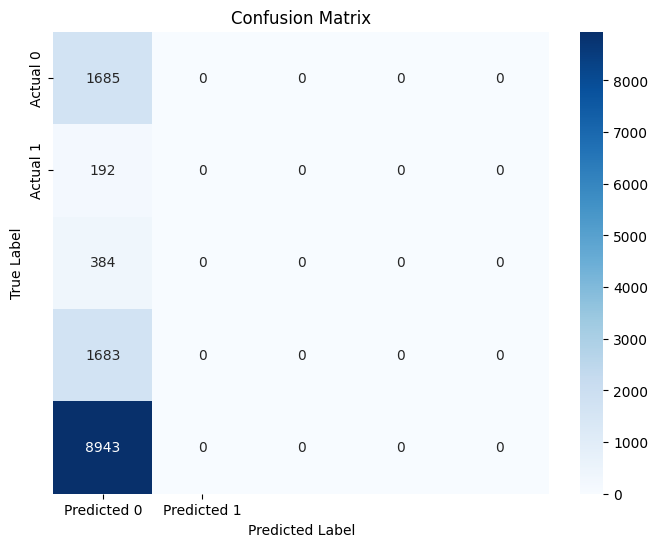

In [112]:
# prompt: Confusion Matrix

from sklearn.metrics import confusion_matrix
import seaborn as sns

# Assuming y_test and y_pred are already defined from the model prediction

# Convert predicted probabilities to class labels (assuming a threshold of 0.5)
y_pred_classes = (y_pred > 0.5).astype(int)

# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred_classes)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Predicted 0', 'Predicted 1'],
            yticklabels=['Actual 0', 'Actual 1'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


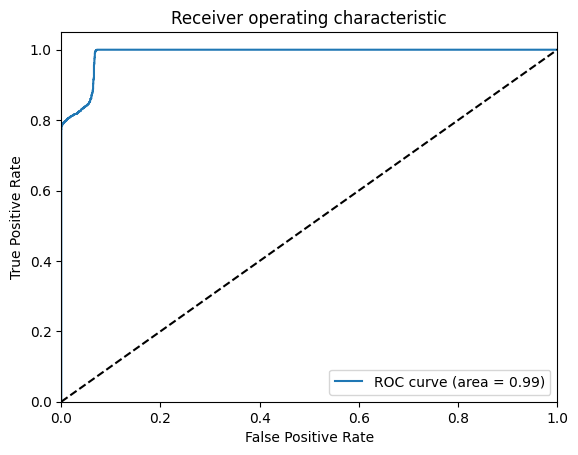

In [117]:
# prompt: ROC curve

from sklearn.metrics import roc_curve, auc
import numpy as np

# Assuming y_test and y_pred are already defined from the model prediction
# y_pred should be probabilities, not class labels

# If y_test has more than 2 classes, convert it to binary
# For example, if you want to consider CSAT scores > 3 as positive:
y_test_binary = (y_test > 3).astype(int)

# Convert y_pred to 1D if it's not already
y_pred = y_pred.ravel()

# Compute ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_test_binary, y_pred)  # Use y_test_binary
roc_auc = auc(fpr, tpr)

# Plot of a ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()


Mean Absolute Error on test data: 0.10446203500032425
403/403 ━━━━━━━━━━━━━━━━━━━━ 0s 717us/step
R-squared: 0.9276959896087646


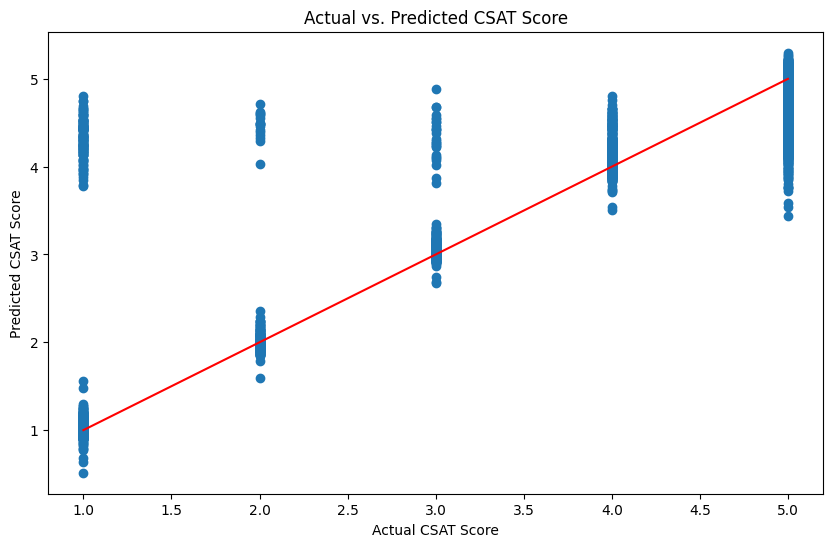

In [141]:
# Testing the model

# Load the saved model
import tensorflow as tf

# Explicitly specify the loss function using the full path
model = tf.keras.models.load_model('csat_prediction_model.h5', custom_objects={'mse': tf.keras.losses.MeanSquaredError()})


# Assuming X_test and y_test are already defined and preprocessed like X_train

# Evaluate the model
loss, mae = model.evaluate(X_test, y_test, verbose=0)
print(f"Mean Absolute Error on test data: {mae}")

# Make predictions
y_pred = model.predict(X_test)

# Further analysis (e.g., calculate R-squared, plot predictions vs. actual values)
from sklearn.metrics import r2_score

r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2}")

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred)
plt.xlabel("Actual CSAT Score")
plt.ylabel("Predicted CSAT Score")
plt.title("Actual vs. Predicted CSAT Score")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red')  # Add a diagonal line
plt.show()


In [89]:
# prompt: deployment of model locally

import pickle

# Assuming your model is loaded as 'model' and preprocessed X_test is available

# Save the model
filename = 'finalized_model.sav'
pickle.dump(model, open(filename, 'wb'))

# Load the model
loaded_model = pickle.load(open(filename, 'rb'))

# Make predictions using the loaded model
y_pred = loaded_model.predict(X_test)


# Example of how to use the loaded model for a single prediction (replace with your actual input data)

# Sample input data (ensure it's in the correct format and preprocessed)
# sample_input = X_test.iloc[0].values.reshape(1,-1)  # Example taking the first row of your test data


# Make a prediction
# sample_prediction = loaded_model.predict(sample_input)

# print(sample_prediction)


145/403 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 14 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


403/403 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step


In [162]:
import tensorflow as tf

# Load the saved model
loaded_model = tf.keras.models.load_model('csat_prediction_model.h5', custom_objects={'mse': tf.keras.losses.MeanSquaredError()})

# Get the expected input shape
input_shape = loaded_model.input_shape  # Access input_shape from the model
print(f"Expected input shape: {1}")  # Print the expected input shape

# Load or create your sample input data
# Assuming sample_input is a NumPy array representing your data
# Replace this with your actual data loading/creation logic
# Example: sample_input = np.array([[5, 5, 5, 3,8]])  # Replace with your data

# Assuming you have X_test from previous code and it's already preprocessed
# sample_input = X_test.iloc[4].values.reshape(1, -1)  # Take the first row of X_test and reshape

# If X_test is not available, create a sample input with the correct number of features
# Make sure the sample input is preprocessed in the same way as the training data
import numpy as np
num_features = loaded_model.input_shape[1]  # Get the number of features expected by the model
sample_input = np.random.rand(1, num_features)  # Create a random sample with the correct shape


# Preprocess the sample input data using the same steps as during training
# (If not already preprocessed)
# ...

# Reshape the sample input data to match the expected input shape
# sample_input should already be the correct shape (1, num_features)
# If you need to reshape, make sure it aligns with loaded_model.input_shape[1:]
# sample_input = sample_input.reshape(input_shape[1:])  # If reshaping is necessary

# Make a prediction
sample_prediction = loaded_model.predict(sample_input) # Remove None and 16. Use sample_input

print(sample_prediction)

Expected input shape: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
[[5.3112993]]


In [136]:
# prompt: Insights from the csat score

# Analyze CSAT Score distribution for insights

# Calculate the average CSAT score
average_csat = df['CSAT Score'].mean()
print(f"Average CSAT Score: {average_csat}")

# Calculate the median CSAT score
median_csat = df['CSAT Score'].median()
print(f"Median CSAT Score: {median_csat}")

# Identify the most frequent CSAT score
mode_csat = df['CSAT Score'].mode()[0]
print(f"Mode CSAT Score: {mode_csat}")

# Analyze CSAT Score distribution across different product categories
product_category_csat = df.groupby('Product_category')['CSAT Score'].mean()
print("\nAverage CSAT Score by Product Category:\n", product_category_csat)

# Analyze CSAT Score distribution across different channels
channel_csat = df.groupby('channel_name')['CSAT Score'].mean()
print("\nAverage CSAT Score by Channel:\n", channel_csat)





Average CSAT Score: 4.242157216524847
Median CSAT Score: 5.0
Mode CSAT Score: 5

Average CSAT Score by Product Category:
 Product_category
Affiliates                     4.204819
Books & General merchandise    4.030695
Electronics                    4.024649
Furniture                      3.619958
GiftCard                       3.230769
Home                           3.954819
Home Appliences                3.702308
LifeStyle                      4.109276
Mobile                         3.646189
Name: CSAT Score, dtype: float64

Average CSAT Score by Channel:
 channel_name
Email      3.899107
Inbound    4.251372
Outcall    4.269909
Name: CSAT Score, dtype: float64


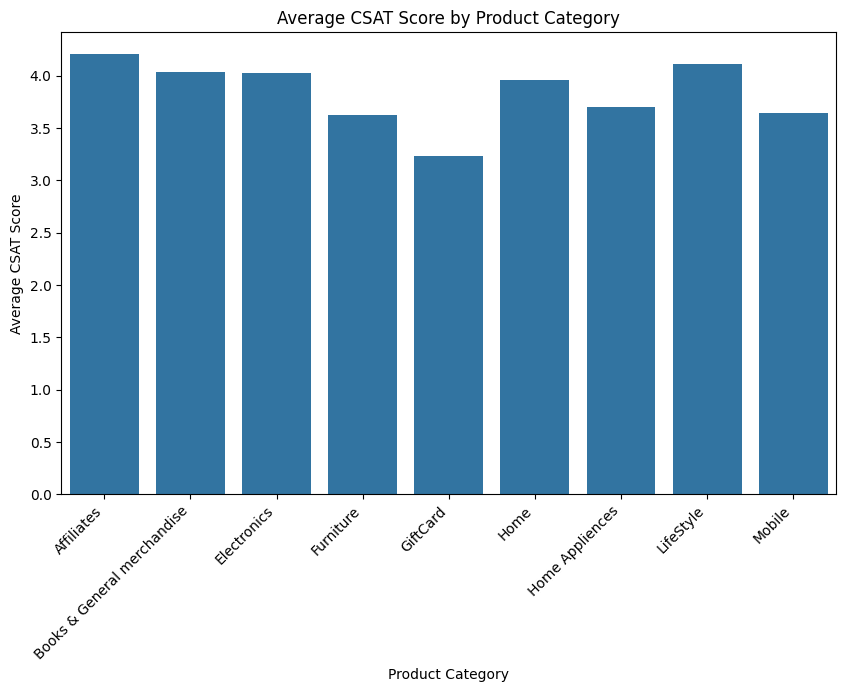

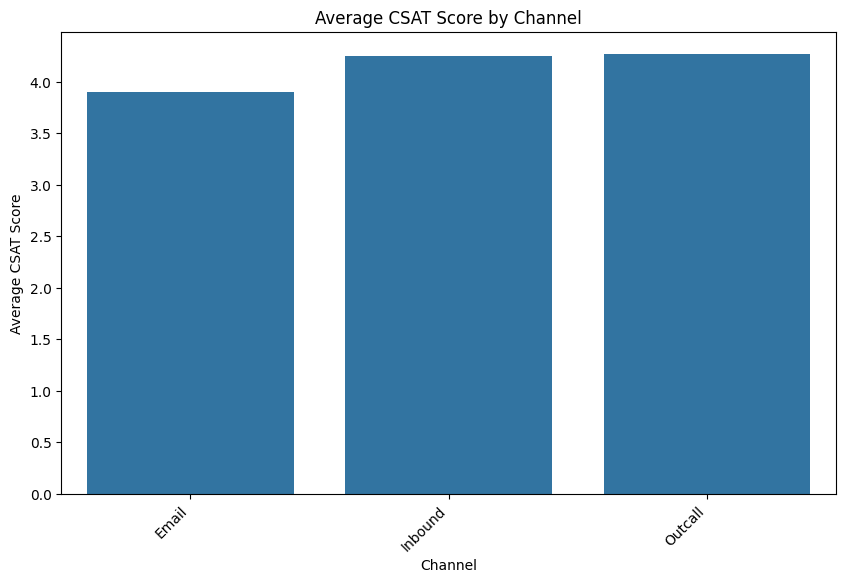

In [135]:
# prompt: Visualize the insight

import matplotlib.pyplot as plt
import seaborn as sns

# Analyze CSAT Score distribution across different product categories
product_category_csat = df.groupby('Product_category')['CSAT Score'].mean()
plt.figure(figsize=(10, 6))
sns.barplot(x=product_category_csat.index, y=product_category_csat.values)
plt.title('Average CSAT Score by Product Category')
plt.xlabel('Product Category')
plt.ylabel('Average CSAT Score')
plt.xticks(rotation=45, ha='right')
plt.show()

# Analyze CSAT Score distribution across different channels
channel_csat = df.groupby('channel_name')['CSAT Score'].mean()
plt.figure(figsize=(10, 6))
sns.barplot(x=channel_csat.index, y=channel_csat.values)
plt.title('Average CSAT Score by Channel')
plt.xlabel('Channel')
plt.ylabel('Average CSAT Score')
plt.xticks(rotation=45, ha='right')
plt.show()




## **Key** **Findings**

##1. Mode of CSAT SCORE is 5 that means most of the customers are happy.
##2.Product wise if we see then affiliate products and books have better rating .
##3. Channelwise Outcall customers are more happy than email or inbound.

## **Action to be taken :**

## 1. All other products' customers should be also entertained well.
## 2. Customer support system should be better , the company must improve their email services.


                                        ** Thank You **

